<!-- --- -->
title: Spatial Temporal
date: 2023-04-01
authors:
  - name: J. Emmanuel Johnson
    affiliations:
      - MEOM Lab
    roles:
      - Primary Programmer
    email: jemanjohnson34@gmail.com
license: CC-BY-4.0
keywords: NerFs, Images
---

In [1]:
import autoroot
import jax
import jax.numpy as jnp
import jax.scipy as jsp
import jax.random as jrandom
import numpy as np
import numba as nb
import equinox as eqx
import kernex as kex
import finitediffx as fdx
import diffrax as dfx
import xarray as xr
import metpy
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm, trange
from jaxtyping import Float, Array, PyTree, ArrayLike
import wandb
from omegaconf import OmegaConf
import hydra
from sklearn import pipeline
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from jejeqx._src.transforms.dataframe.spatial import Spherical2Cartesian
from jejeqx._src.transforms.dataframe.temporal import TimeDelta
from jejeqx._src.transforms.dataframe.scaling import MinMaxDF

sns.reset_defaults()
sns.set_context(context="talk", font_scale=0.7)
jax.config.update("jax_enable_x64", False)

%env XLA_PYTHON_CLIENT_PREALLOCATE=false

%matplotlib inline
%load_ext autoreload
%autoreload 2

env: XLA_PYTHON_CLIENT_PREALLOCATE=false


## Recap Formulation

We are interested in learning non-linear functions $\boldsymbol{f}$.

$$
\begin{aligned}
\boldsymbol{f}(\mathbf{x}) &=
\mathbf{w}^\top\boldsymbol{\phi}(\mathbf{x})+\mathbf{b}
\end{aligned}
$$

where the $\boldsymbol{\phi}(\cdot)$ is a basis function. Neural Fields typically try to learn this basis funciton via a series of composite functions of the form

$$
\boldsymbol{\phi}(\mathbf{x}) =
\boldsymbol{\phi}_L\circ\boldsymbol{\phi}_{L-1}
\circ\cdots\circ
\boldsymbol{\phi}_2\circ\boldsymbol{\phi}_{1}(\mathbf{x})
$$

## Problems

Here, we will demonstrate a problem that a naive network has.

## Data

In [2]:
# !wget wget -nc https://s3.us-east-1.wasabisys.com/melody/osse_data/ref/NATL60-CJM165_GULFSTREAM_ssh_y2013.1y.nc

In [4]:
from pathlib import Path

In [5]:
Path("/gpfswork/rech/cli/uvo53rl/projects/jejeqx/data/natl60/NATL60-CJM165_GULFSTREAM_ssh_y2013.1y.nc").is_file()

True

In [6]:
# @dataclass
# class Subset:
#     _target_: str = "slice"
#     _args_: List = field(default_factory=lambda :["2013-01-01", "2013-01-10"])

In [7]:
from dataclasses import dataclass, field
from typing import List, Dict



# @dataclass
# class SSHDM:
#     _target_: str = "jejeqx._src.datamodules.natl60.SSHSTNATL60"
#     batch_size: int = 10_000
#     shuffle: bool = False
#     split_method: str = "random"
#     train_size: float = 0.80
#     spatial_coords: List = field(default_factory=lambda : ["x", "y", "z"])
#     temporal_coords: List = field(default_factory=lambda: ["time"])
#     variables: List = field(default_factory=lambda : ["ssh"])
#     coarsen: Dict = field(default_factory=lambda : {"lon": 4, "lat": 4})
#     directory: str = "/gpfswork/rech/cli/uvo53rl/projects/jejeqx/data/natl60/"
    
    
@dataclass
class SSHDM:
    _target_: str = "jejeqx._src.datamodules.coords.AlongTrackDM"
    batch_size: int = 10_000
    shuffle: bool = False
    train_size: float = 0.80
    spatial_coords: List = field(default_factory=lambda : ["lat", "lon"])
    temporal_coords: List = field(default_factory=lambda: ["time"])
    variables: List = field(default_factory=lambda : ["ssh"])
    coarsen: Dict = field(default_factory=lambda : {"lon": 2, "lat": 2})
    decode_times: bool=False
    resample: str = "1D"
    paths: str = "/gpfswork/rech/cli/uvo53rl/projects/jejeqx/data/natl60/NATL60-CJM165_GULFSTREAM_ssh_y2013.1y.nc"
    # paths: str = "/gpfswork/rech/yrf/commun/data_challenges/dc20a_osse/test/dc_ref/NATL60-CJM165_GULFSTREAM*"

# spatial transform
spatial_transforms = Pipeline([
    ("cartesian3d", Spherical2Cartesian(radius=1.0, units="degrees")),
    ("spatialminmax", MinMaxDF(["x", "y", "z"], -1, 1)),
])

temporal_transforms = Pipeline([
    ("timedelta", TimeDelta("2012-10-01", 1, "s")),
    ("timeminmax", MinMaxDF(["time"], -1, 1)),
])

In [8]:
select = {"time": slice("2013-01-01", "2013-10-30")}

config_dm = OmegaConf.structured(SSHDM())

dm = hydra.utils.instantiate(
    config_dm,
    select=select,
    spatial_transform=spatial_transforms,
    temporal_transform=temporal_transforms,
)

dm.setup()



init = dm.ds_train[:32]
x_init, t_init, y_init = init["spatial"], init["temporal"], init["data"]
x_init.min(), x_init.max(), x_init.shape, t_init.min(), t_init.max(), t_init.shape

Index(['lat', 'lon'], dtype='object') Index(['time'], dtype='object') Index(['ssh'], dtype='object')


/gpfsdswork/projects/rech/cli/uvo53rl/projects/jejeqx/jejeqx/_src/transforms/dataframe/temporal.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["time"] = time


(-0.8628599955828857,
 0.9245991739426795,
 (32, 3),
 -0.963235294117647,
 0.8676470588235294,
 (32, 1))

In [9]:
len(dm.ds_train), len(dm.ds_test)

(2184000, 2730000)

In [10]:
xrda = dm.load_xrds()

In [11]:
# import geoviews as gv
# import geoviews.feature as gf
# from cartopy import crs

# gv.extension('bokeh', 'matplotlib')

In [12]:
xrda

<xarray.Dataset>
Dimensions:  (time: 273, lat: 100, lon: 100)
Coordinates:
  * lon      (lon) float64 -64.97 -64.88 -64.78 -64.68 ... -55.28 -55.18 -55.08
  * lat      (lat) float64 33.02 33.12 33.22 33.32 ... 42.62 42.72 42.82 42.92
  * time     (time) datetime64[ns] 2013-01-01 2013-01-02 ... 2013-09-30
Data variables:
    ssh      (time, lat, lon) float64 0.5287 0.5203 0.5084 ... -0.1667 -0.14

In [13]:
# import geoviews as gv
# import geoviews.feature as gf
# from cartopy import crs

# gv.extension('bokeh', 'matplotlib')

In [14]:
# dataset = gv.Dataset(xrda_obs)
# ensemble1 = dataset.to(gv.Image, ['lon', 'lat'], "ssh")
# gv.output(ensemble1.opts(cmap='viridis', colorbar=True, fig_size=200, backend='matplotlib') * gf.coastline(),
#           backend='matplotlib')

In [15]:
# dataset = gv.Dataset(xrda)
# ensemble1 = dataset.to(gv.Image, ['lon', 'lat'], "ssh")
# ensemble2 = dataset.to(gv.Image, ['lon', 'lat'], "ssh_lmsiren")
# gv.output(ensemble1.opts(cmap='viridis', colorbar=True, fig_size=200, backend='matplotlib') * gf.coastline(),
#           backend='matplotlib')

In [16]:
!ls /gpfswork/rech/cli/uvo53rl/checkpoints/nerfs/siren/natl60/full/

checkpoint_model.ckpt  config.pkl


In [17]:
import joblib

model_config_file = "/gpfswork/rech/cli/uvo53rl/checkpoints/nerfs/siren/natl60/full/config.pkl"
checkpoint_file = "/gpfswork/rech/cli/uvo53rl/checkpoints/nerfs/siren/natl60/full/checkpoint_model.ckpt"

old_config = joblib.load(model_config_file)

model = hydra.utils.instantiate(old_config["model"])

In [18]:
old_config["model"]

{'network': {'key': {'seed': 42, '_target_': 'jax.random.PRNGKey'},
  '_target_': 'equinox.nn.Linear',
  'use_bias': True,
  'in_features': 256,
  'out_features': 1},
 '_target_': 'jejeqx._src.nets.nerfs.base.NerF',
 'basis_net': {'key': {'seed': 123, '_target_': 'jax.random.PRNGKey'},
  'depth': 5,
  'in_size': 4,
  '_target_': 'jejeqx._src.nets.nerfs.siren.SirenNet',
  'out_size': 256,
  'width_size': 256}}

In [ ]:
eqx.pprint(model)

## Optimizer (+ Learning Rate)

In [22]:
import optax

num_epochs = 2_000

@dataclass
class Optimizer:
    _target_: str = "optax.adam"
    learning_rate: float = 1e-4

# FINETUNE!
@dataclass
class Scheduler:
    _target_: str = "optax.warmup_cosine_decay_schedule"
    init_value: float = 0.0
    peak_value: float = 1e-2
    warmup_steps: int = 500
    end_value: float = 1e-6
    
scheduler_config = OmegaConf.structured(Scheduler())

In [23]:
optim_config = OmegaConf.structured(Optimizer())

optimizer = hydra.utils.instantiate(optim_config)

# num_steps_per_epoch = len(dm.ds_train)

# scheduler = hydra.utils.instantiate(
#     scheduler_config, 
#     decay_steps=int(num_epochs * num_steps_per_epoch)
# )

# optimizer = optax.chain(optimizer, optax.scale_by_schedule(scheduler))

## Trainer Module

In [24]:
import glob
import os
from pathlib import Path

from jejeqx._src.trainers.base import TrainerModule
from jejeqx._src.trainers.callbacks import wandb_model_artifact
from jejeqx._src.losses import psnr


class RegressorTrainer(TrainerModule):
    def __init__(self,
                 model,
                 optimizer,
                 **kwargs):
        super().__init__(
            model=model, 
            optimizer=optimizer, 
            pl_logger=None,
            **kwargs
        )
        
    @property
    def model(self):
        return self.state.params

    @property
    def model_batch(self):
        return jax.vmap(self.state.params, in_axes=(0,0))

    def create_functions(self):

        @eqx.filter_value_and_grad
        def mse_loss(model, batch):
            x, t, y = batch["spatial"], batch["temporal"], batch["data"]
            pred = jax.vmap(model)(jnp.hstack([x, t]))
            # x, t, y = batch["spatial"], batch["temporal"], batch["data"]
            # pred = jax.vmap(model, in_axes=(0,0))(x, t)
            loss = jnp.mean((y - pred)**2)
            return loss
        
        def train_step(state, batch):
            
            loss, grads = mse_loss(state.params, batch)
            state = state.update_state(state, grads)
            psnr_loss = psnr(loss) 
            metrics = {"loss": loss, "psnr": psnr_loss}
            return state, loss, metrics
        
        def eval_step(model, batch):
            loss, _ = mse_loss(model, batch)
            psnr_loss = psnr(loss) 
            return {"loss": loss, "psnr": psnr_loss}

        def test_step(model, batch):
            x, t, y = batch["spatial"], batch["temporal"], batch["data"]
            out = jax.vmap(model)(jnp.hstack([x, t]))
            loss, _ = mse_loss(model, batch)
            psnr_loss = psnr(loss)
            return out, {"loss": loss, "psnr": psnr_loss}
        
        def predict_step(model, batch):
            x, t = batch["spatial"], batch["temporal"]
            out = jax.vmap(model)(jnp.hstack([x, t]))
            return out

        return train_step, eval_step, test_step, predict_step
    
    
    def on_training_end(self,):
        
        if self.pl_logger:
            save_dir = Path(self.log_dir).joinpath(self.save_name)
            self.save_model(save_dir)
            wandb_model_artifact(self)
            self.pl_logger.finalize("success")
        
        


In [25]:
seed = 123
debug = False
enable_progress_bar = False
log_dir = "./"

trainer = RegressorTrainer(
    model, 
    optimizer, 
    seed=seed, 
    debug=debug, 
    enable_progress_bar=enable_progress_bar,
    log_dir=log_dir
)

train_more = False
save_new = True

In [26]:
%%time


out, metrics = trainer.test_model(dm.test_dataloader())
metrics

CPU times: user 10.6 s, sys: 195 ms, total: 10.8 s
Wall time: 10.7 s


{'loss': 0.30777427554130554, 'psnr': 5.06638765335083}

In [27]:
# trainer.load_model("./checkpoints/checkpoint_model_stlmsiren_ssh_more.ckpt")
# trainer.load_model("./checkpoints/checkpoint_natl60_model_rff.ckpt")
trainer.load_model(checkpoint_file)

In [28]:
%%time


out, metrics = trainer.test_model(dm.test_dataloader())
metrics

CPU times: user 9.92 s, sys: 77.2 ms, total: 10 s
Wall time: 9.77 s


{'loss': 0.0007167395087890327, 'psnr': 65.87297058105469}

In [29]:
%%time
if train_more:
    metrics = trainer.train_model(dm, num_epochs=num_epochs)

CPU times: user 0 ns, sys: 24 µs, total: 24 µs
Wall time: 48.2 µs


In [30]:
%%time

if train_more:
    out, metrics = trainer.test_model(dm.test_dataloader())
    print(metrics)

CPU times: user 20 µs, sys: 4 µs, total: 24 µs
Wall time: 47.2 µs


In [31]:
# if save_new:
#     # trainer.save_model("./checkpoints/check point_model_stlmsiren_ssh_more.ckpt")
#     trainer.save_model("./checkpoints/checkpoint_natl60_model_rff.ckpt")
# # # trainer.save_state("checkpoint_state.ckpt")

In [32]:
xrda["ssh_siren"] = dm.data_to_df(out).to_xarray().ssh

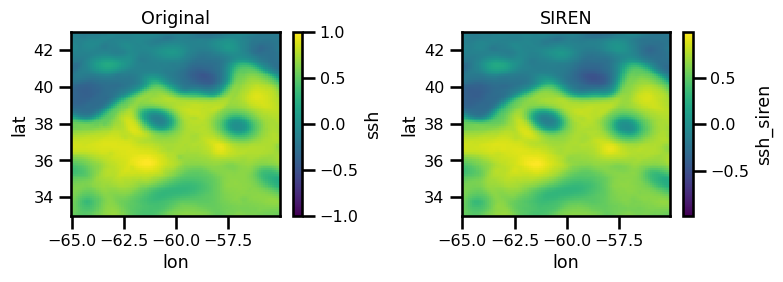

In [34]:
fig, ax = plt.subplots(ncols=2, figsize=(8,3))

xrda.ssh.isel(time=0).plot.pcolormesh(ax=ax[0], cmap="viridis")
ax[0].set(title="Original")

xrda.ssh_siren.isel(time=0).plot.pcolormesh(ax=ax[1], cmap="viridis")
ax[1].set(title="SIREN")

plt.tight_layout()
plt.show()

## Analysis

In [35]:
import common_utils as cutils

In [36]:
ds_rff = cutils.calculate_physical_quantities(xrda.ssh_siren)
ds_natl60 = cutils.calculate_physical_quantities(xrda.ssh)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Layout
   .HoloMap.NATL60 :HoloMap   [time]
      :QuadMesh   [lon,lat]   (NATL60)
   .HoloMap.SIREN  :HoloMap   [time]
      :QuadMesh   [lon,lat]   (SIREN)
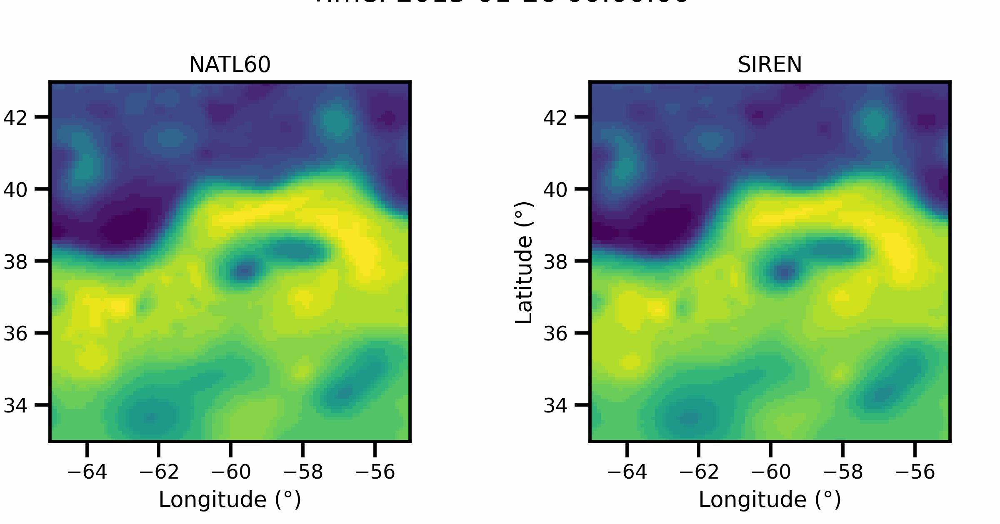

In [83]:
import holoviews as hv
hv.extension("matplotlib")


variable = "ssh" # "vort_r" # "ke" #  
cmap = "viridis" # "RdBu_r" # "YlGnBu_r" #

ssh_ds = xr.Dataset({
    "NATL60": ds_natl60[variable],
    "SIREN": ds_rff[variable],
})

ssh_ds["NATL60"] = (("time", "lat", "lon"), ds_natl60[variable].data.magnitude)
ssh_ds["SIREN"] = (("time", "lat", "lon"), ds_rff[variable].data.magnitude)

to_plot_ds = ssh_ds.isel(time=slice(25, 55, 1)).transpose("time", "lat", "lon")

clim = (
    to_plot_ds[["NATL60", "SIREN"]].to_array().pipe(lambda da: (da.quantile(0.005).item(), da.quantile(0.995).item()))
)

images = hv.Layout([
    hv.Dataset(to_plot_ds)
    .to(hv.QuadMesh, ["lon", "lat"], v).relabel(v)
    .options(cmap=cmap, clim=clim)
    for v in to_plot_ds]
).cols(2).opts(sublabel_format="")

hv.output(images, holomap="gif", fps=2, dpi=300)

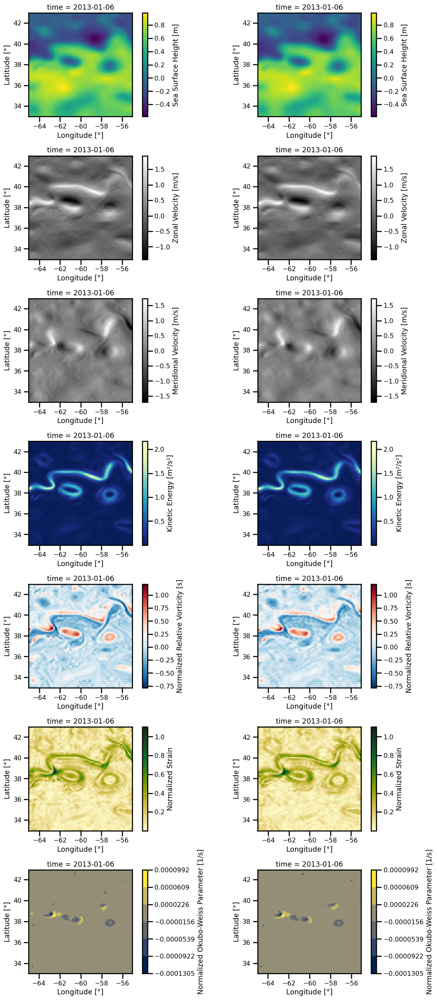

In [30]:
fig, ax = cutils.plot_analysis_vars([
    ds_natl60.isel(time=5),
    ds_rff.isel(time=5),],
    figsize=(12,25),
)
plt.show()

### Simple Stats

In [106]:
def rmse_da(da, da_ref, dim):
    return (((da - da_ref) ** 2).mean(dim=dim) ** 0.5)


def nrmse_da(da, da_ref, dim):
    
    rmse = rmse_da(da=da, da_ref=da_ref, dim=dim)
    std = (da_ref**2).mean(dim=dim) ** 0.5    
    return 1.0 - (rmse / std).data.magnitude

In [96]:
import pandas as pd

results_df = pd.DataFrame()

for imodel, iname in zip(
    [ds_rff],
    ["SIREN"]
):
    for ivar in imodel:
        error_space = nrmse_da(imodel[ivar], ds_natl60[ivar], ["lat", "lon", "time"])
        error_time = nrmse_da(imodel[ivar], ds_natl60[ivar], ["time"]).std()
        
        ires_df = pd.DataFrame(
            data=[[iname, ivar, error_space.item(), error_time.item()]],
            columns = [ "model", "variable", "nrmse (mu)", "nrsme (std)"],
        )
        
        results_df = pd.concat([ires_df, results_df.loc[:]], axis=0)

In [104]:
results_df

,model,variable,nrmse (mu),nrsme (std)
0,SIREN,ow,0.362635,0.163767
0,SIREN,strain,0.662064,0.065419
0,SIREN,vort_r,0.515160,0.108568
0,SIREN,ke,0.731556,0.090475
0,SIREN,v,0.758297,0.086048
0,SIREN,u,0.786954,0.089809
0,SIREN,psi,0.948671,0.042246
0,SIREN,ssh,0.948671,0.042246


In [105]:
ds_psd_natl60 = cutils.calculate_isotropic_psd(ds_natl60)
ds_psd_rff = cutils.calculate_isotropic_psd(ds_rff)

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

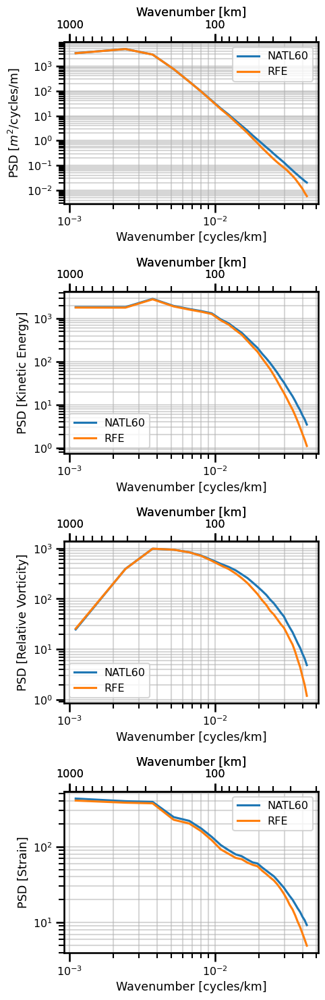

In [111]:
%matplotlib inline

fig, ax = cutils.plot_analysis_psd_iso(
    [ds_psd_natl60, ds_psd_rff,],
    ["NATL60","RFE", ]
)
plt.show()

In [112]:
ds_scores = cutils.calculate_isotropic_psd_score(ds_rff, ds_natl60)

  0%|          | 0/4 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


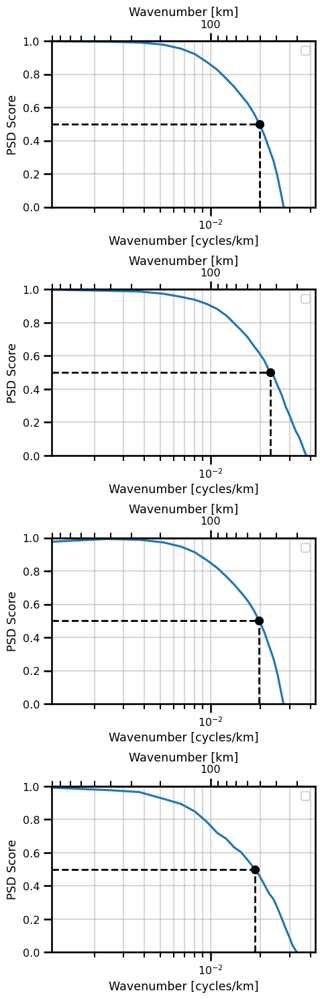

In [113]:
%matplotlib inline

cutils.plot_analysis_psd_iso_score([ds_scores], ["RFE"], ["k"])
plt.show()

In [114]:
ds_psd_natl60 = cutils.calculate_spacetime_psd(ds_natl60)
ds_psd_rff = cutils.calculate_spacetime_psd(ds_rff)


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

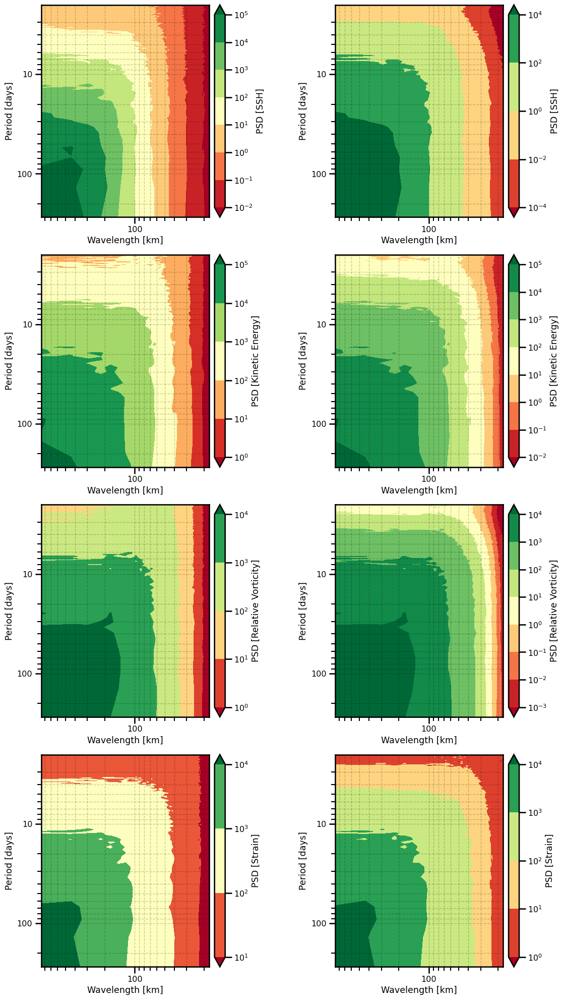

In [115]:
%matplotlib inline

fig, ax = cutils.plot_analysis_psd_spacetime(
    [ds_psd_natl60, ds_psd_rff,],
    ["NATL60","RFE", ]
)
plt.show()

In [116]:
ds_psd_rff = cutils.calculate_spacetime_psd_score(ds_rff, ds_natl60)

  0%|          | 0/4 [00:00<?, ?it/s]

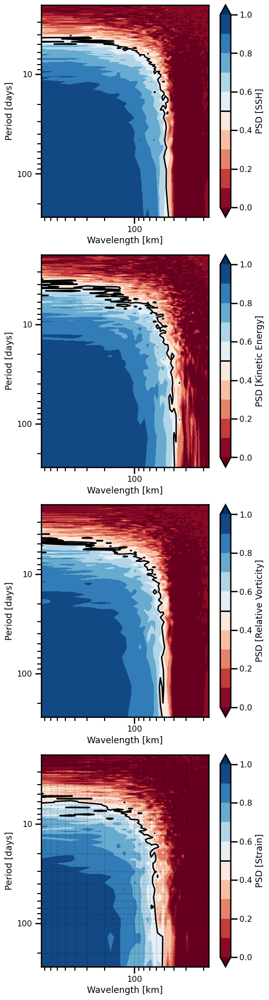

In [117]:
%matplotlib inline

_ = cutils.plot_analysis_psd_spacetime_score(
    [ds_psd_rff], ["rff"]
)